### Develop code for volcano plot data query and plotting

In [1]:
import os
os.chdir("../../../src/dash")

from data import get_omics_data, get_combined_data

In [2]:
from sqlalchemy import create_engine, MetaData, Table, select, join
import pandas as pd

# SQLite path
db_path = 'sqlite:///../../data/SQLite Database/20200527/Covid-19 Study DB.sqlite'

def get_p_values():

    # Create an engine that connects to the Covid-19 Study DB.sqlite file: engine
    engine = create_engine(db_path)

    # Establish connection
    connection = engine.connect()

    query = "SELECT * from biomolecules WHERE KEEP=1"
    # get biomolecule names
    biomolecules_df = pd.read_sql_query(query, connection)

    # build biomolecule name dict and drop list
    biomolecule_name_dict = {}
    for index, row in biomolecules_df.iterrows():
        biomolecule_id = str(row['biomolecule_id'])
        standardized_name = row['standardized_name']
        biomolecule_name_dict[biomolecule_id] = standardized_name

    query = "SELECT * from pvalues"
    # get biomolecule names
    pvalues_df = pd.read_sql_query(query, connection)
    
    return pvalues_df

In [3]:
pvalues_df = get_p_values()

In [4]:
metabolomics_df, metabolomics_quant_range = get_omics_data(dataset='metabolomics', with_metadata=True)
lipidomics_df, lipidomics_quant_range = get_omics_data(dataset='lipidomics', with_metadata=True)
proteomics_df, proteomics_quant_range = get_omics_data(dataset='proteomics', with_metadata=True)

df_dict = {
    "proteomics":proteomics_df,
    "lipidomics":lipidomics_df,
    "metabolomics":metabolomics_df,
}

quant_value_range_dict = {
    "proteomics":proteomics_quant_range,
    "lipidomics":lipidomics_quant_range,
    "metabolomics":metabolomics_quant_range,
}

df_dict, quant_value_range_dict = get_combined_data(df_dict, quant_value_range_dict)

In [14]:
combined_df = df_dict['combined']
quant_value_range = quant_value_range_dict['combined']

combined_df.head()

,7593,7596,7597,7599,7600,7601,7602,7605,7606,7607,...,Albany_sampleID,COVID,Hospital_free_days,Age_less_than_90,Gender,ICU_1,APACHEII,Charlson_score,Mech_Ventilation,Vent_free_days
sample_id,,,,,,,,,,,,,,,,,,,,,
1.0,37.710878,28.960165,29.486177,26.675595,19.370255,25.517883,26.493429,30.410945,31.088410,30.999944,...,C1,1,0,39,M,0,15,0,1,0
2.0,37.240139,28.102745,28.188532,27.733115,19.990200,19.812219,24.845320,29.028257,31.023136,31.772071,...,C2,1,22,63,M,0,,2,0,28
3.0,37.637201,28.665126,27.422219,20.724576,24.932560,22.113618,25.717407,31.937930,30.425124,30.072398,...,C3,1,1,33,M,0,,2,0,28
4.0,38.145233,27.830079,29.649296,26.203592,26.040009,24.332789,26.232187,30.945938,29.962098,29.797982,...,C4,1,22,49,M,0,,1,0,28
5.0,37.896564,29.343630,29.503473,27.011693,25.772082,25.169400,26.949490,32.916129,32.403777,32.162940,...,C5,1,10,49,M,0,19,1,1,23


## Now calculate effect size (fold change) for COVID vs NOCOVID

In [15]:
# quant value dict for COVID patients
group_1_quant_value_dict = {}
comparison_column = 'COVID'

group_1 = "1" #COVID
group_2 = "0" #NOCOVID

quant_value_columns = combined_df.columns[:quant_value_range]
for sample_id, row in combined_df[combined_df[comparison_column]==group_1].iterrows():
    
    for biomolecule_id in quant_value_columns:
        quant_value = row[biomolecule_id]
        
        if not biomolecule_id in group_1_quant_value_dict:
            group_1_quant_value_dict[biomolecule_id] = [quant_value]
            
        else:
            group_1_quant_value_dict[biomolecule_id].append(quant_value)


In [16]:
group_2_quant_value_dict = {}

for sample_id, row in combined_df[combined_df[comparison_column]==group_2].iterrows():
    
    for biomolecule_id in quant_value_columns:
        quant_value = row[biomolecule_id]
        
        if not biomolecule_id in group_2_quant_value_dict:
            group_2_quant_value_dict[biomolecule_id] = [quant_value]
            
        else:
            group_2_quant_value_dict[biomolecule_id].append(quant_value)

In [17]:
# calculate FCs
import numpy as np

FC_dict = {}
for biomolecule_id in quant_value_columns:
    
    group_1_quant_values = group_1_quant_value_dict[biomolecule_id]
    group_2_quant_values = group_2_quant_value_dict[biomolecule_id]
    
    # in log2 space; subtract
    FC = np.mean(group_1_quant_values) - np.mean(group_2_quant_values)
    
    FC_dict[biomolecule_id] = FC

In [18]:
# now add these values to pvalues_df
pvalues_df

,pvalue_id,biomolecule_id,test,comparison,confounders,p_value,q_value,log2_FC
0,1,1,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.019955,0.118517,NaN
1,2,2,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.338124,0.584938,NaN
2,3,3,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.520246,0.724835,NaN
3,4,4,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.328140,0.576177,NaN
4,5,5,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.485816,0.702526,NaN
...,...,...,...,...,...,...,...,...
7963,7964,8330,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.710884,0.849674,-0.148926
7964,7965,8334,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.135689,0.359825,0.388885
7965,7966,8335,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.288944,0.538181,-0.367235
7966,7967,8336,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.241377,0.488774,-0.689704


## Get standardized names

In [59]:
from data import get_biomolecule_names

# make biomolecule_name_dict
metabolomics_biomolecule_names_dict = get_biomolecule_names(dataset='metabolomics')
lipidomics_biomolecule_names_dict = get_biomolecule_names(dataset='lipidomics')
proteomics_biomolecule_names_dict = get_biomolecule_names(dataset='proteomics')

global_names_dict = {
    "proteomics":proteomics_biomolecule_names_dict,
    "lipidomics":lipidomics_biomolecule_names_dict,
    "metabolomics":metabolomics_biomolecule_names_dict,
    "combined":{**proteomics_biomolecule_names_dict,
                **lipidomics_biomolecule_names_dict,
                **metabolomics_biomolecule_names_dict}
}

In [69]:
FC_list = []
ome_list = []
standardized_name_list = []
for index, row in pvalues_df.iterrows():
    biomolecule_id = str(row['biomolecule_id'])
    
    ## NOTE: should create biomolecule_ome_dict
    if biomolecule_id in proteomics_df.columns:
        ome_list.append("proteomics")
    elif biomolecule_id in lipidomics_df.columns:
        ome_list.append("lipidomics")
    elif biomolecule_id in metabolomics_df.columns:
        ome_list.append("metabolomics")
    else:
        print("Biomolecule {} not mapped to ome!".format(biomolecule_id)) # don't currenly have targeted metabolomics included
        ome_list.append(np.nan)
        #break
        
    try:
        FC = FC_dict[biomolecule_id]
    except:
        # may have been a dropped biomolecule or from a different ome
        FC = np.nan
        
    FC_list.append(FC)
    
    try:
        standardized_name = global_names_dict['combined'][biomolecule_id]
    except:
        # may have been a dropped biomolecule or from a different ome
        standardized_name = np.nan
        
    standardized_name_list.append(standardized_name)
    
pvalues_df['log2_FC'] = FC_list
pvalues_df['ome_type'] = ome_list
pvalues_df['standardized_name'] = standardized_name_list

Biomolecule 7538 not mapped to ome!
Biomolecule 7539 not mapped to ome!
Biomolecule 7540 not mapped to ome!
Biomolecule 7541 not mapped to ome!
Biomolecule 7543 not mapped to ome!
Biomolecule 7546 not mapped to ome!
Biomolecule 7547 not mapped to ome!
Biomolecule 7548 not mapped to ome!
Biomolecule 7550 not mapped to ome!
Biomolecule 7552 not mapped to ome!
Biomolecule 7553 not mapped to ome!
Biomolecule 7554 not mapped to ome!
Biomolecule 7556 not mapped to ome!
Biomolecule 7557 not mapped to ome!
Biomolecule 7558 not mapped to ome!
Biomolecule 7561 not mapped to ome!
Biomolecule 7564 not mapped to ome!
Biomolecule 7565 not mapped to ome!
Biomolecule 7567 not mapped to ome!
Biomolecule 7568 not mapped to ome!
Biomolecule 7569 not mapped to ome!
Biomolecule 7570 not mapped to ome!
Biomolecule 7571 not mapped to ome!
Biomolecule 7572 not mapped to ome!
Biomolecule 7574 not mapped to ome!
Biomolecule 7575 not mapped to ome!
Biomolecule 7577 not mapped to ome!
Biomolecule 7578 not mapped 

In [70]:
pvalues_df['log2_FC'].describe()

count    7929.000000
mean        0.137637
std         0.576782
min        -3.473017
25%        -0.160695
50%         0.101433
75%         0.474699
max         5.545505
Name: log2_FC, dtype: float64

In [71]:
len(FC_dict)

7929

In [72]:
pvalues_df['neg_log10_p_value'] = pvalues_df['p_value'].apply(np.log10).apply(np.negative)

In [73]:
pvalues_df.head()

,pvalue_id,biomolecule_id,test,comparison,confounders,p_value,q_value,log2_FC,neg_log10_p_value,ome_type,standardized_name
0,1,1,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.019955,0.118517,-0.140597,1.699957,metabolomics,unknown RT 4.081766
1,2,2,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.338124,0.584938,0.066689,0.470924,metabolomics,unknown RT 4.148561
2,3,3,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.520246,0.724835,0.020856,0.283791,metabolomics,unknown RT 5.261918
3,4,4,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.328140,0.576177,0.017168,0.483941,metabolomics,unknown RT 5.349937
4,5,5,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.485816,0.702526,-0.399715,0.313528,metabolomics,unknown RT 5.462593


## Now make a scatter volcano plot

In [122]:
color_dict = {
                "COVID_ICU":"#D53E4F",
                "COVID_NONICU":"#FDAE61",
                "NONCOVID_ICU":"#74ADD1",
                "NONCOVID_NONICU":"#66C2A5",
                "Male":"#F46D43",
                "Female":"#5AAE61",
                "Col7":"#8073AC",
                "Col8":"#DE77AE",
                "proteomics":"#9E0142",
                "lipidomics":"#F4A582",
                "metabolomics":"#2A4023",
                "transcriptomics":"#2C0379",
                "selected_biomolecule":"black"
                }

import plotly.express as px

fig = px.scatter(pvalues_df.dropna(), x="log2_FC", y="neg_log10_p_value",
    hover_data=['biomolecule_id', 'standardized_name', 'p_value', 'q_value'],
    opacity=0.5, 
    size='neg_log10_p_value',
    color='ome_type',
    color_discrete_map=color_dict)

#fig.update_traces(marker=dict(size=10, opacity=0.5))

confounders = ", ".join(pvalues_df.iloc[0]['confounders'].split(";"))

fig.update_layout(
    title="P values corrected by: {} (n={})".format(confounders, pvalues_df.shape[0]),
    legend_title_text='Group',
    xaxis_title='Effect Size (log2 FC)',
    yaxis_title='Significance (-log10(Corrected P-value))',
    font=dict(
        family="Helvetica",
        size=18,
        color="#7f7f7f")
    )

fig.show()
fig.write_html("../../figures/multi-omics_volcano.html")

In [85]:
ls ../../figures

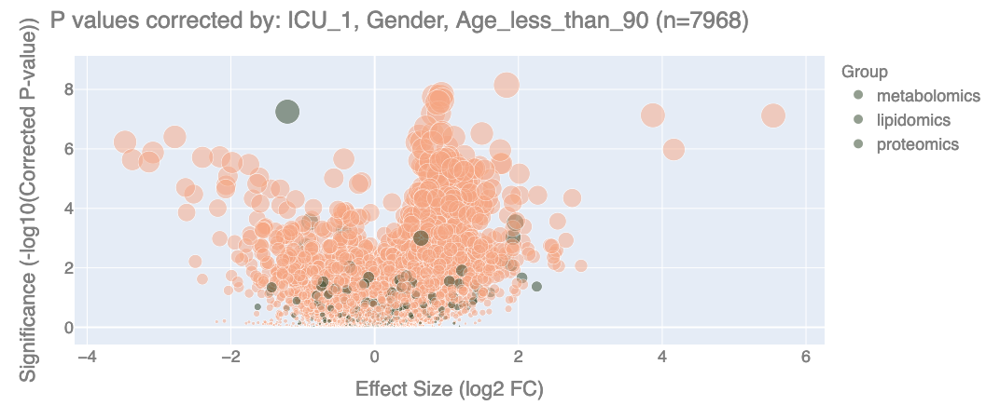

In [111]:
new_color_list = [color_dict[i] for i in pvalues_df.dropna()['ome_type']]
fig.update_traces(marker={'color':new_color_list})

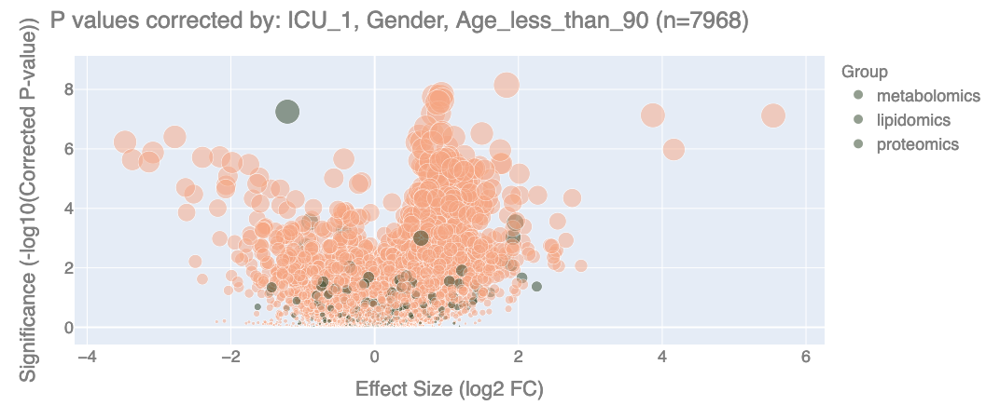

In [115]:
biomolecule_id = "125"
fig.update_traces(marker_color="RoyalBlue",
                  selector=dict(some_variable="125"))

In [121]:
pvalues_df[pvalues_df['standardized_name']=='Gelsolin']

,pvalue_id,biomolecule_id,test,comparison,confounders,p_value,q_value,log2_FC,neg_log10_p_value,ome_type,standardized_name
7726,7727,7974,LR_test,COVID_vs_NONCOVID,ICU_1;Gender;Age_less_than_90,0.009989,0.078809,-0.567419,2.000478,proteomics,Gelsolin


In [119]:
fig['data']

(Scattergl({
     'customdata': array([[1, 'unknown RT 4.081766', 0.01995457795762063, 0.11851674054380072],
                          [2, 'unknown RT 4.148561', 0.33812367751683403, 0.5849375533561573],
                          [3, 'unknown RT 5.261918', 0.5202463492206877, 0.7248345287244479],
                          ...,
                          [211, 'Cholesterol derivative RT25.501888', 0.1319060098582076,
                           0.35439469045536826],
                          [213, 'unknown RT 27.639949', 0.031990768628918476,
                           0.15373018452042098],
                          [214, 'Sugar RT28.077994', 0.5936709652228854, 0.7761323020447667]],
                         dtype=object),
     'hovertemplate': ('ome_type=metabolomics<br>log2_' ... '{customdata[3]}<extra></extra>'),
     'legendgroup': 'metabolomics',
     'marker': {'color': [#2A4023, #2A4023, #2A4023, ..., #9E0142, #9E0142,
                          #9E0142],
                'opacity': 

In [108]:
pvalues_df.dropna()['ome_type']

0       metabolomics
1       metabolomics
2       metabolomics
3       metabolomics
4       metabolomics
            ...     
7963      proteomics
7964      proteomics
7965      proteomics
7966      proteomics
7967      proteomics
Name: ome_type, Length: 7929, dtype: object